Importamos librerias

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip /content/drive/MyDrive/Logos/LLD-icon_full_data_PNG.zip

Streaming output truncated to the last 5000 lines.
 extracting: LLD_favicons_full_png/058419.png  
 extracting: LLD_favicons_full_png/077529.png  
 extracting: LLD_favicons_full_png/090763.png  
 extracting: LLD_favicons_full_png/460621.png  
 extracting: LLD_favicons_full_png/389816.png  
 extracting: LLD_favicons_full_png/502825.png  
 extracting: LLD_favicons_full_png/486942.png  
 extracting: LLD_favicons_full_png/487806.png  
 extracting: LLD_favicons_full_png/523833.png  
 extracting: LLD_favicons_full_png/232016.png  
 extracting: LLD_favicons_full_png/424343.png  
 extracting: LLD_favicons_full_png/289310.png  
 extracting: LLD_favicons_full_png/085778.png  
 extracting: LLD_favicons_full_png/287993.png  
 extracting: LLD_favicons_full_png/056147.png  
 extracting: LLD_favicons_full_png/212602.png  
 extracting: LLD_favicons_full_png/273796.png  
 extracting: LLD_favicons_full_png/367115.png  
 extracting: LLD_favicons_full_png/139927.png  
 extracting: LLD_favicons_full_png/26

In [3]:
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision.io import read_image, ImageReadMode
from torchvision.utils import save_image
from torchvision.utils import make_grid
from tqdm.notebook import tqdm
from torchsummary import summary
import torch.nn.functional as F
import torchvision.transforms as T
import torch.nn as nn
import torchvision
import torch
import matplotlib.pyplot as plt
%matplotlib inline
import os

Primero usamos el dataset completo sin aplicar transformaciones

In [4]:
IMAGE_DIR = r'/content/LLD_favicons_full_png'
BATCH_SIZE = 1024

Creamos un Custom DataSet

In [5]:
class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_labels = os.listdir(img_dir)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_labels[idx])
        image = read_image(img_path, ImageReadMode.RGB)
        name = self.img_labels[idx]
        if self.transform:
            image = self.transform(image)
        return image

In [6]:
normal_dataset = CustomImageDataset(IMAGE_DIR)
dataloader = DataLoader(normal_dataset, batch_size=BATCH_SIZE, shuffle=True, pin_memory=True)

In [7]:
len(normal_dataset)

548210

In [8]:
i=iter(normal_dataset)

In [9]:
next(i).shape

torch.Size([3, 32, 32])

In [10]:
type(next(i))

torch.Tensor

Obtengamos unas imagenes

In [11]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(
        make_grid(images.detach()[:nmax], nrow=8).permute(1, 2, 0))


def show_batch(dataloader, nmax=64):
    for images in dataloader:
        show_images(images, nmax)
        break

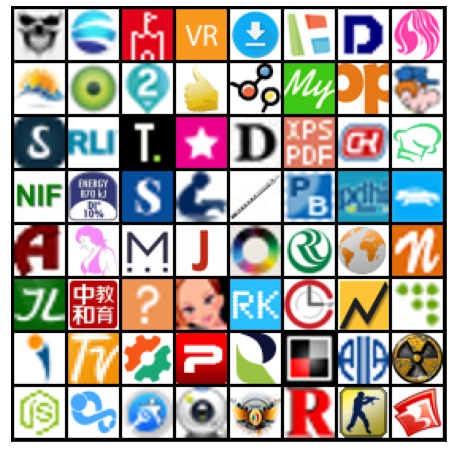

In [12]:
show_batch(dataloader)

Ahora que sabemos que la visualización funciona, podemos continuar con la creación de GAN. Primero, comenzaremos con el discriminador.

# Modelos discriminadores

A continuación, hago algunos posibles modelos de discriminadores para probar.

Este es mi primer esfuerzo para hacer un discriminador para este conjunto de datos.

In [13]:
discriminator = nn.Sequential(
    
    nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(32),
    nn.LeakyReLU(0.3, inplace=True),

    nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.3, inplace=True),

    nn.Conv2d(64, 128, kernel_size=4, stride=1, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.3, inplace=True),

    nn.Conv2d(128, 256, kernel_size=4, stride=1, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.3, inplace=True),

    nn.Conv2d(256, 512, kernel_size=4, stride=1, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.3, inplace=True),

    nn.Conv2d(512, 1024, kernel_size=4, stride=1, padding=1, bias=False),
    nn.BatchNorm2d(1024),
    nn.LeakyReLU(0.3, inplace=True),

    nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0, bias=False),
    nn.Flatten(),
    nn.Sigmoid()
)


# Modelos de generadores
A continuación se muestra una lista de algunos posibles modelos de generador para probar. Estos modelos son operaciones inversas de los discriminadores.

Aquí está el primer generador:

In [14]:
SEED_SIZE = 1024

In [15]:
generator = nn.Sequential(
    
    nn.ConvTranspose2d(SEED_SIZE, 1024, kernel_size=4, padding=0, stride=1, bias=False),
    nn.BatchNorm2d(1024),
    nn.ReLU(True),
    
    nn.ConvTranspose2d(1024, 512, kernel_size=4, padding=1, stride=1, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    
    nn.ConvTranspose2d(512, 256, kernel_size=4, padding=1, stride=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    
    nn.ConvTranspose2d(256, 128, kernel_size=4, padding=1, stride=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    
    nn.ConvTranspose2d(128, 64, kernel_size=4, padding=1, stride=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    
    nn.ConvTranspose2d(64, 32, kernel_size=4, padding=1, stride=2, bias=False),
    nn.BatchNorm2d(32),
    nn.ReLU(True),
    
    nn.ConvTranspose2d(32, 3, kernel_size=4, padding=1, stride=2, bias=False),
    nn.Tanh()
)

# GPU Setup
Deberíamos entrenar esto en GPU

In [16]:
def get_training_device():
    # Use the GPU if possible
    if torch.cuda.is_available():
        return torch.device('cuda')
    # Otherwise use the CPU :-(
    return torch.device('cpu')

def to_device(data, device):
    # This moves the tensors to the device (GPU, CPU)
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

In [17]:
device = get_training_device()
device

device(type='cuda')

Si la salida anterior no dice nada sobre 'cuda', asegurate que la computadora, o Colab esta configurado con un GPU, tambien es importante mencionar si instalas Torch en tu computara, es mas facil seguir esta configuracion para asegurarte de que las liberias estan instaladas correctamente, https://pytorch.org/get-started/locally/

Ahora, usamos la clase de cargador de datos del dispositivo para enviar datos a nuestro dispositivo elegido:

In [18]:
dev_dataloader = DeviceDataLoader(dataloader, device)

# **Funciones de prueba**

## Discriminator

In [19]:
def train_discriminator(real_logos, disc_optimizer):
    # Reset the gradients for the optimizer
    disc_optimizer.zero_grad()
    
    # Train on the real images
    real_predictions = discriminator(real_logos)
    real_targets = torch.rand(real_logos.size(0), 1, device=device) * (0.1 - 0) + 0 # Add some noisy labels to make the discriminator think harder.
    real_loss = F.binary_cross_entropy(real_predictions, real_targets).to('cuda') # Can do binary loss function because it is a binary classifier
    real_score = torch.mean(real_predictions).item() # How well does the discriminator classify the real logo? (Higher score is better for the discriminator)
    
    # Make some latent tensors to seed the generator
    latent_batch = torch.randn(BATCH_SIZE, SEED_SIZE, 1, 1, device=device)
    
    # Get some fake logos
    fake_logos = generator(latent_batch)
    
    # Train on the generator's current efforts to trick the discriminator
    gen_predictions = discriminator(fake_logos)
    gen_targets = torch.rand(fake_logos.size(0), 1, device=device) * (1 - 0.9) + 0.9 # Add some noisy labels to make the discriminator think harder.
    gen_loss = F.binary_cross_entropy(gen_predictions, gen_targets).to('cuda')
    gen_score = torch.mean(gen_predictions).item() # How well did the discriminator classify the fake logo? (Lower score is better for the discriminator)
    
    # Update the discriminator weights
    total_loss = real_loss + gen_loss
    total_loss.backward()
    disc_optimizer.step()
    return total_loss.item(), real_score, gen_score

## Generator

In [20]:
def train_generator(gen_optimizer):
    # Clear the generator gradients
    gen_optimizer.zero_grad()

    # Generate some fake logos
    latent_batch = torch.randn(BATCH_SIZE, SEED_SIZE, 1, 1, device=device)
    fake_logos = generator(latent_batch)

    # Test against the discriminator
    disc_predictions = discriminator(fake_logos)
    # We want the discriminator to think these images are real.
    targets = torch.zeros(fake_logos.size(0), 1, device=device)
    # How well did the generator do? (How much did the discriminator believe the generator?)
    loss = F.binary_cross_entropy(disc_predictions, targets).to('cuda')

    # Update the generator based on how well it fooled the discriminator
    loss.backward()
    gen_optimizer.step()

    # Return generator loss
    return loss.item()


## Results Viewer
Queremos poder ver los resultados a medida que generamos logos.

In [21]:
RESULTS_DIR = '/content/drive/MyDrive/results'
os.makedirs(RESULTS_DIR, exist_ok=True)

In [22]:
def save_results(index, latent_batch, show=True):
    # Generate fake logos
    fake_logos = generator(latent_batch)
    
    # Make the filename for the output
    fake_file = "result-image-{0:0=4d}.png".format(index)
    
    # Save the image
    save_image(fake_logos, os.path.join(RESULTS_DIR, fake_file))
    print("Result Saved!")
    
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_logos.cpu().detach(), nrow=8).permute(1, 2, 0))

# **Full Training**

In [23]:
# Static generation seed batch
fixed_latent_batch = torch.randn(BATCH_SIZE, SEED_SIZE, 1, 1, device=device)

def train(epochs, learning_rate, start_idx=1):
    # Empty the GPU cache to save some memory
    torch.cuda.empty_cache()

    
    # Track losses and scores
    disc_losses = []
    disc_scores = []
    gen_losses = []
    gen_scores = []
    
    # Create the optimizers
    disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.9))
    gen_optimizer = torch.optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.9))
    
    # Run the loop
    for epoch in range(epochs):
        # Go through each image
        for real_img in tqdm(dev_dataloader):
            # Train the discriminator
            disc_loss, real_score, gen_score = train_discriminator(real_img.float(), disc_optimizer)
            # Train the generator
            gen_loss = train_generator(gen_optimizer)
        
        # Collect results
        disc_losses.append(disc_loss)
        disc_scores.append(real_score)
        gen_losses.append(gen_loss)
        gen_scores.append(gen_score)
        
        # Print the losses and scores
        print(f"Epoch [{epoch+start_idx}/{epochs}], gen_loss: {gen_loss:.4f}, disc_loss: {disc_loss:.4f}, real_score: {real_score:.4f}, gen_score: {gen_score:.4f}")
        
        # Save the images and show the progress
        save_results(epoch + start_idx, fixed_latent_batch, show=False)
    
    # Return stats
    return disc_losses, disc_scores, gen_losses, gen_scores

# Seleccion de modelos

Aquí, selecciono los modelos que se envian a la GPU

In [24]:
# Discriminators
discriminator = to_device(discriminator, device)
# Generators
generator = to_device(generator, device)


In [25]:
!set 'PYTORCH_CUDA_ALLOC_CONF=max_split_size_mb:1024'

In [26]:
summary(discriminator, (3, 32, 32), batch_size=BATCH_SIZE)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [1024, 32, 16, 16]           1,536
       BatchNorm2d-2         [1024, 32, 16, 16]              64
         LeakyReLU-3         [1024, 32, 16, 16]               0
            Conv2d-4           [1024, 64, 8, 8]          32,768
       BatchNorm2d-5           [1024, 64, 8, 8]             128
         LeakyReLU-6           [1024, 64, 8, 8]               0
            Conv2d-7          [1024, 128, 7, 7]         131,072
       BatchNorm2d-8          [1024, 128, 7, 7]             256
         LeakyReLU-9          [1024, 128, 7, 7]               0
           Conv2d-10          [1024, 256, 6, 6]         524,288
      BatchNorm2d-11          [1024, 256, 6, 6]             512
        LeakyReLU-12          [1024, 256, 6, 6]               0
           Conv2d-13          [1024, 512, 5, 5]       2,097,152
      BatchNorm2d-14          [1024, 51

In [27]:
seed_batch = torch.randn(BATCH_SIZE, SEED_SIZE, 1, 1, device=device)

# obtengamos algunos logos falsos
to_device(generator, device)
fake_logos = generator(seed_batch)
print(fake_logos.size())

torch.Size([1024, 3, 32, 32])


In [28]:
summary(generator, (SEED_SIZE, 1, 1), batch_size=BATCH_SIZE)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1         [1024, 1024, 4, 4]      16,777,216
       BatchNorm2d-2         [1024, 1024, 4, 4]           2,048
              ReLU-3         [1024, 1024, 4, 4]               0
   ConvTranspose2d-4          [1024, 512, 5, 5]       8,388,608
       BatchNorm2d-5          [1024, 512, 5, 5]           1,024
              ReLU-6          [1024, 512, 5, 5]               0
   ConvTranspose2d-7          [1024, 256, 6, 6]       2,097,152
       BatchNorm2d-8          [1024, 256, 6, 6]             512
              ReLU-9          [1024, 256, 6, 6]               0
  ConvTranspose2d-10          [1024, 128, 7, 7]         524,288
      BatchNorm2d-11          [1024, 128, 7, 7]             256
             ReLU-12          [1024, 128, 7, 7]               0
  ConvTranspose2d-13           [1024, 64, 8, 8]         131,072
      BatchNorm2d-14           [1024, 6

# Tiempo de entrenamiento
Aquí se editan los hiperparámetros y se entrena la GAN

In [29]:
# learning_rate = 0.0025 # worked fairly well for disc/gen_64_1
learning_rate = 0.00275
epochs = 50

In [30]:
history = train(epochs, learning_rate)

  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [1/50], gen_loss: 3.3102, disc_loss: 0.9888, real_score: 0.0677, gen_score: 0.6422
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [2/50], gen_loss: 1.9660, disc_loss: 1.2369, real_score: 0.5821, gen_score: 0.8335
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [3/50], gen_loss: 1.0837, disc_loss: 1.3372, real_score: 0.6464, gen_score: 0.8515
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [4/50], gen_loss: 1.0927, disc_loss: 1.3410, real_score: 0.5227, gen_score: 0.5840
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [5/50], gen_loss: 1.4312, disc_loss: 0.8327, real_score: 0.3643, gen_score: 0.7699
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [6/50], gen_loss: 2.9987, disc_loss: 0.9202, real_score: 0.1605, gen_score: 0.5443
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [7/50], gen_loss: 0.3781, disc_loss: 1.5735, real_score: 0.7126, gen_score: 0.8273
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [8/50], gen_loss: 2.3279, disc_loss: 0.9124, real_score: 0.2832, gen_score: 0.6335
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [9/50], gen_loss: 3.5382, disc_loss: 1.0336, real_score: 0.2544, gen_score: 0.5448
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [10/50], gen_loss: 1.3796, disc_loss: 0.8197, real_score: 0.3567, gen_score: 0.8127
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [11/50], gen_loss: 6.0142, disc_loss: 0.9203, real_score: 0.1352, gen_score: 0.5579
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [12/50], gen_loss: 3.0495, disc_loss: 0.6938, real_score: 0.3329, gen_score: 0.9264
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [13/50], gen_loss: 3.0445, disc_loss: 0.5963, real_score: 0.0616, gen_score: 0.7369
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [14/50], gen_loss: 6.9338, disc_loss: 1.6382, real_score: 0.0281, gen_score: 0.2607
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [15/50], gen_loss: 2.4868, disc_loss: 0.5030, real_score: 0.1737, gen_score: 0.9090
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [16/50], gen_loss: 4.1598, disc_loss: 0.4460, real_score: 0.0654, gen_score: 0.9071
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [17/50], gen_loss: 4.6580, disc_loss: 0.4782, real_score: 0.1229, gen_score: 0.9857
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [18/50], gen_loss: 3.7676, disc_loss: 0.8888, real_score: 0.3868, gen_score: 0.9898
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [19/50], gen_loss: 3.0274, disc_loss: 0.5456, real_score: 0.0436, gen_score: 0.7771
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [20/50], gen_loss: 4.2726, disc_loss: 0.6871, real_score: 0.2943, gen_score: 0.9918
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [21/50], gen_loss: 1.6612, disc_loss: 0.4427, real_score: 0.0215, gen_score: 0.8947
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [22/50], gen_loss: 4.0117, disc_loss: 0.4120, real_score: 0.0505, gen_score: 0.9625
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [23/50], gen_loss: 3.8208, disc_loss: 0.4247, real_score: 0.0790, gen_score: 0.8987
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [24/50], gen_loss: 3.5917, disc_loss: 0.4866, real_score: 0.1026, gen_score: 0.9887
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [25/50], gen_loss: 0.4291, disc_loss: 1.0737, real_score: 0.5438, gen_score: 0.9911
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [26/50], gen_loss: 2.4365, disc_loss: 0.5037, real_score: 0.1767, gen_score: 0.9823
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [27/50], gen_loss: 3.6240, disc_loss: 0.4229, real_score: 0.0640, gen_score: 0.9175
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [28/50], gen_loss: 3.3521, disc_loss: 0.4173, real_score: 0.0787, gen_score: 0.9232
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [29/50], gen_loss: 3.1594, disc_loss: 0.4521, real_score: 0.0982, gen_score: 0.9013
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [30/50], gen_loss: 2.7672, disc_loss: 0.4827, real_score: 0.1722, gen_score: 0.9512
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [31/50], gen_loss: 8.5446, disc_loss: 0.9305, real_score: 0.0570, gen_score: 0.4989
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [32/50], gen_loss: 6.4110, disc_loss: 0.4999, real_score: 0.0976, gen_score: 0.9945
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [33/50], gen_loss: 3.0294, disc_loss: 0.4428, real_score: 0.0642, gen_score: 0.8651
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [34/50], gen_loss: 1.9119, disc_loss: 0.5189, real_score: 0.1913, gen_score: 0.8960
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [35/50], gen_loss: 3.6732, disc_loss: 0.4381, real_score: 0.0223, gen_score: 0.9076
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [36/50], gen_loss: 1.7500, disc_loss: 0.4260, real_score: 0.0219, gen_score: 0.9521
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [37/50], gen_loss: 5.2131, disc_loss: 0.4529, real_score: 0.0125, gen_score: 0.9676
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [38/50], gen_loss: 3.2453, disc_loss: 0.4322, real_score: 0.0846, gen_score: 0.9697
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [39/50], gen_loss: 2.5166, disc_loss: 0.4343, real_score: 0.1053, gen_score: 0.9183
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [40/50], gen_loss: 2.7383, disc_loss: 0.5696, real_score: 0.2526, gen_score: 0.9367
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [41/50], gen_loss: 2.6681, disc_loss: 0.4729, real_score: 0.0087, gen_score: 0.9406
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [42/50], gen_loss: 7.5343, disc_loss: 0.6130, real_score: 0.0113, gen_score: 0.7302
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [43/50], gen_loss: 2.6854, disc_loss: 0.5147, real_score: 0.1801, gen_score: 0.8797
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [44/50], gen_loss: 1.0992, disc_loss: 0.5106, real_score: 0.1975, gen_score: 0.9244
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [45/50], gen_loss: 3.0553, disc_loss: 0.4094, real_score: 0.0711, gen_score: 0.9231
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [46/50], gen_loss: 1.8675, disc_loss: 0.5132, real_score: 0.2089, gen_score: 0.9512
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [47/50], gen_loss: 3.4031, disc_loss: 0.4015, real_score: 0.0417, gen_score: 0.9429
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [48/50], gen_loss: 2.2973, disc_loss: 0.4938, real_score: 0.1786, gen_score: 0.9707
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [49/50], gen_loss: 3.2180, disc_loss: 0.4120, real_score: 0.0703, gen_score: 0.9659
Result Saved!


  0%|          | 0/536 [00:00<?, ?it/s]

Epoch [50/50], gen_loss: 4.3095, disc_loss: 0.4884, real_score: 0.0239, gen_score: 0.8367
Result Saved!


# Visualizacion de resultados
Aqui, veremos los resultados de LogoGAN usando la clase Image de IPython

In [31]:
from IPython.display import Image

Hay algunas manchas que aparecen en el epoch 1.

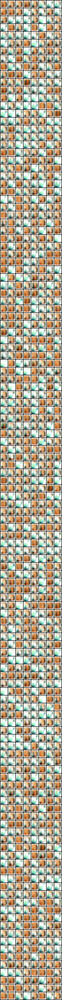

In [32]:
Image(r'/content/drive/MyDrive/results/result-image-0001.png')

En el epoch 25 se aprecia mas definicion

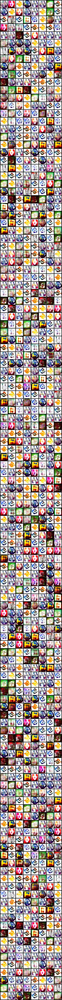

In [33]:
Image(r'/content/drive/MyDrive/results/result-image-0025.png')

En el epoch 50, tenemos mas claridad y tendencias de color

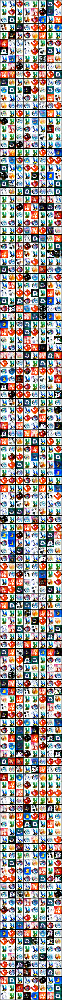

In [34]:
Image(r'/content/drive/MyDrive/results/result-image-0050.png')

# Análisis de rendimiento

Aqui hay algunos gráficos para ayudar a ajustar el generador / discriminador. Esto muestra pérdidas y puntuaciones a lo largo del tiempo.

In [35]:
# Extract metrics
disc_losses, disc_scores, gen_losses, gen_scores = history

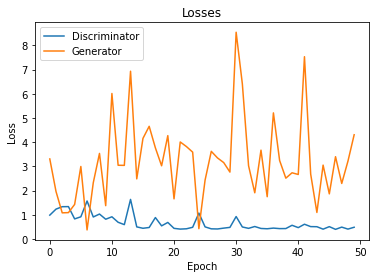

In [36]:
# Plot generator and discriminator losses
plt.plot(disc_losses, '-')
plt.plot(gen_losses, '-')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

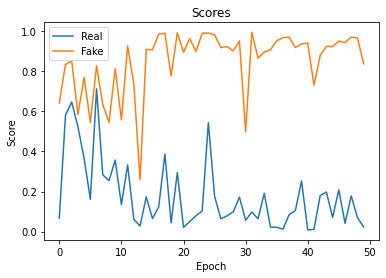

In [37]:
# Plots scores vs. epochs
plt.plot(disc_scores, '-')
plt.plot(gen_scores, '-')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

# Fuentes

- Jovian.ml DCGAN example from PyTorch Zero to GANs Course: https://jovian.ml/aakashns/06b-anime-dcgan
- Tips and tricks about training GANs: https://medium.com/@utk.is.here/keep-calm-and-train-a-gan-pitfalls-and-tips-on-training-generative-adversarial-networks-edd529764aa9

##GPU INFO

In [38]:
print('__Python VERSION:', sys.version)
print('__pyTorch VERSION:', torch.__version__)
print('__CUDA VERSION', )
from subprocess import call
call(["nvidia-smi", "--format=csv", "--query-gpu=index,name,driver_version,memory.total,memory.used,memory.free"])
! nvidia-smi
! nvcc --version
print('__CUDNN VERSION:', torch.backends.cudnn.version())
print('__Number CUDA Devices:', torch.cuda.device_count())
print('__Devices')
print('Active CUDA Device: GPU', torch.cuda.current_device())
print ('Available devices ', torch.cuda.device_count())
print ('Current cuda device ', torch.cuda.current_device())

NameError: ignored